# Maestría en ciencia de datos
# Procesamiento y clasificación de datos

# Procesamiento de imágenes con `opencv`

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Cargar una imagen en modo BGR (en lugar de RGB)
img = cv2.imread('/content/Lenna_(test_image).png')

## Referencias
- https://imagemagick.org/index.php
- https://opencv.org/
- https://www.gimp.org/

In [ ]:
img.shape

(512, 512, 3)

array([[[125, 137, 226],
        [125, 137, 226],
        [133, 137, 223],
        ...,
        [122, 148, 230],
        [110, 130, 221],
        [ 90,  99, 200]],

       [[125, 137, 226],
        [125, 137, 226],
        [133, 137, 223],
        ...,
        [122, 148, 230],
        [110, 130, 221],
        [ 90,  99, 200]],

       [[125, 137, 226],
        [125, 137, 226],
        [133, 137, 223],
        ...,
        [122, 148, 230],
        [110, 130, 221],
        [ 90,  99, 200]],

       ...,

       [[ 60,  18,  84],
        [ 60,  18,  84],
        [ 58,  27,  92],
        ...,
        [ 84,  73, 173],
        [ 76,  68, 172],
        [ 79,  62, 177]],

       [[ 57,  22,  82],
        [ 57,  22,  82],
        [ 62,  32,  96],
        ...,
        [ 79,  70, 179],
        [ 81,  71, 181],
        [ 81,  74, 185]],

       [[ 57,  22,  82],
        [ 57,  22,  82],
        [ 62,  32,  96],
        ...,
        [ 79,  70, 179],
        [ 81,  71, 181],
        [ 81,  74, 185]]], dtype=uint8)
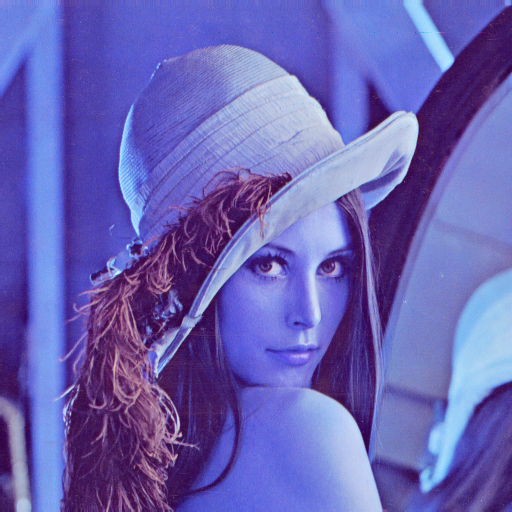

In [ ]:
img

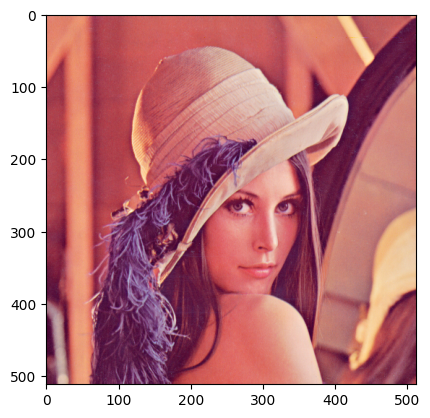

In [ ]:
# Convertir BGR a RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mostrar la imagen usando matplotlib
plt.imshow(img_rgb)
plt.show()

array([[125, 125, 133, ..., 122, 110,  90],
       [125, 125, 133, ..., 122, 110,  90],
       [125, 125, 133, ..., 122, 110,  90],
       ...,
       [ 60,  60,  58, ...,  84,  76,  79],
       [ 57,  57,  62, ...,  79,  81,  81],
       [ 57,  57,  62, ...,  79,  81,  81]], dtype=uint8)
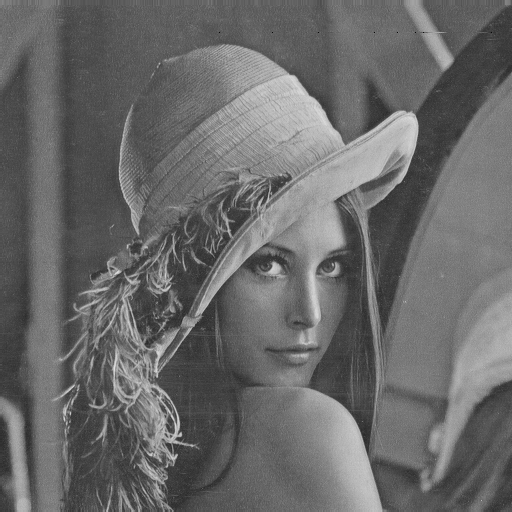

In [ ]:
# Separar los canales de color
B, G, R = cv2.split(img)
B

In [ ]:
R.shape

(512, 512)

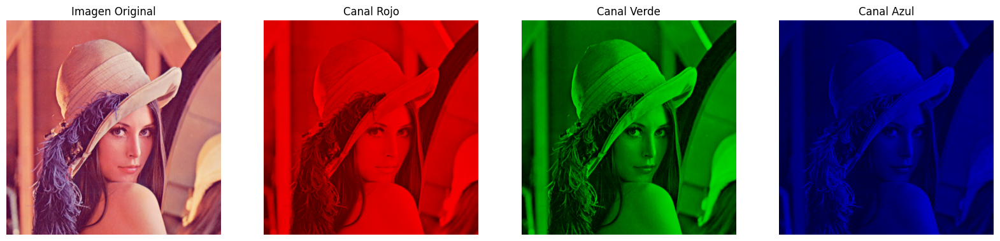

In [ ]:
# Crear una imagen en negro con el mismo tamaño
zeros = np.zeros(img.shape[:2], dtype="uint8")

# Crear imágenes para cada canal de color
img_red = cv2.merge([R, zeros, zeros])
img_green = cv2.merge([zeros, G, zeros])
img_blue = cv2.merge([zeros, zeros, B])

# Visualizar los canales individuales y la imagen original
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Convertir BGR a RGB para matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Imagen original
axes[0].imshow(img_rgb)
axes[0].set_title('Imagen Original')
axes[0].axis('off')

# Canal Rojo
axes[1].imshow(img_red)
axes[1].set_title('Canal Rojo')
axes[1].axis('off')

# Canal Verde
axes[2].imshow(img_green)
axes[2].set_title('Canal Verde')
axes[2].axis('off')

# Canal Azul
axes[3].imshow(img_blue)
axes[3].set_title('Canal Azul')
axes[3].axis('off')

plt.show()

In [ ]:
img_green.min(axis=0)

array([[0, 4, 0],
       [0, 4, 0],
       [0, 5, 0],
       ...,
       [0, 4, 0],
       [0, 4, 0],
       [0, 6, 0]], dtype=uint8)

Esto no tiene que ver con _shaders_.

array([[[226,   0, 125],
        [226,   0, 125],
        [223,   0, 133],
        ...,
        [230,   0, 122],
        [221,   0, 110],
        [200,   0,  90]],

       [[226,   0, 125],
        [226,   0, 125],
        [223,   0, 133],
        ...,
        [230,   0, 122],
        [221,   0, 110],
        [200,   0,  90]],

       [[226,   0, 125],
        [226,   0, 125],
        [223,   0, 133],
        ...,
        [230,   0, 122],
        [221,   0, 110],
        [200,   0,  90]],

       ...,

       [[ 84,   0,  60],
        [ 84,   0,  60],
        [ 92,   0,  58],
        ...,
        [173,   0,  84],
        [172,   0,  76],
        [177,   0,  79]],

       [[ 82,   0,  57],
        [ 82,   0,  57],
        [ 96,   0,  62],
        ...,
        [179,   0,  79],
        [181,   0,  81],
        [185,   0,  81]],

       [[ 82,   0,  57],
        [ 82,   0,  57],
        [ 96,   0,  62],
        ...,
        [179,   0,  79],
        [181,   0,  81],
        [185,   0,  81]]], dtype=uint8)
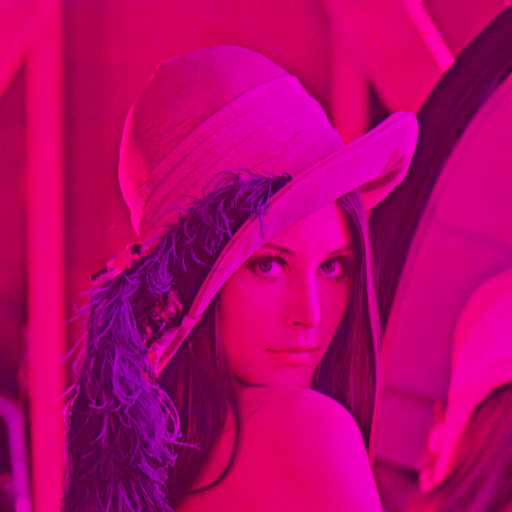

In [ ]:
img_blue + img_red

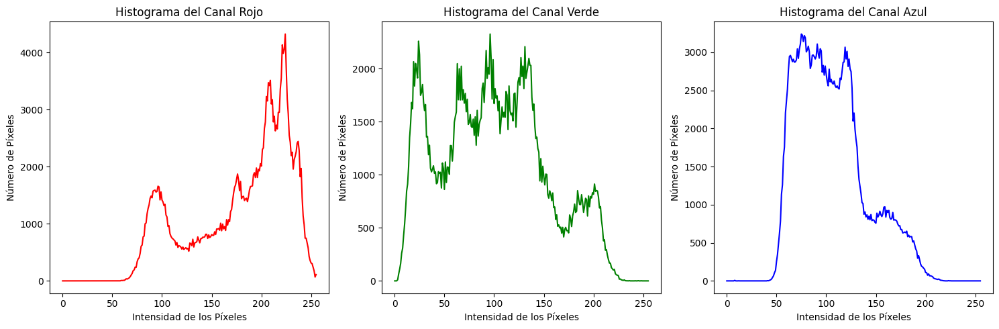

In [ ]:
# Calcular el histograma para cada canal
hist_B = cv2.calcHist([B], [0], None, [256], [0, 256])
hist_G = cv2.calcHist([G], [0], None, [256], [0, 256])
hist_R = cv2.calcHist([R], [0], None, [256], [0, 256])

# Visualizar los histogramas
plt.figure(figsize=(15, 5))

plt.subplot(133)
plt.plot(hist_B, color='blue')
plt.title('Histograma del Canal Azul')
plt.xlabel('Intensidad de los Píxeles')
plt.ylabel('Número de Píxeles')

plt.subplot(132)
plt.plot(hist_G, color='green')
plt.title('Histograma del Canal Verde')
plt.xlabel('Intensidad de los Píxeles')
plt.ylabel('Número de Píxeles')

plt.subplot(131)
plt.plot(hist_R, color='red')
plt.title('Histograma del Canal Rojo')
plt.xlabel('Intensidad de los Píxeles')
plt.ylabel('Número de Píxeles')

plt.tight_layout()
plt.show()

## Escala de grises

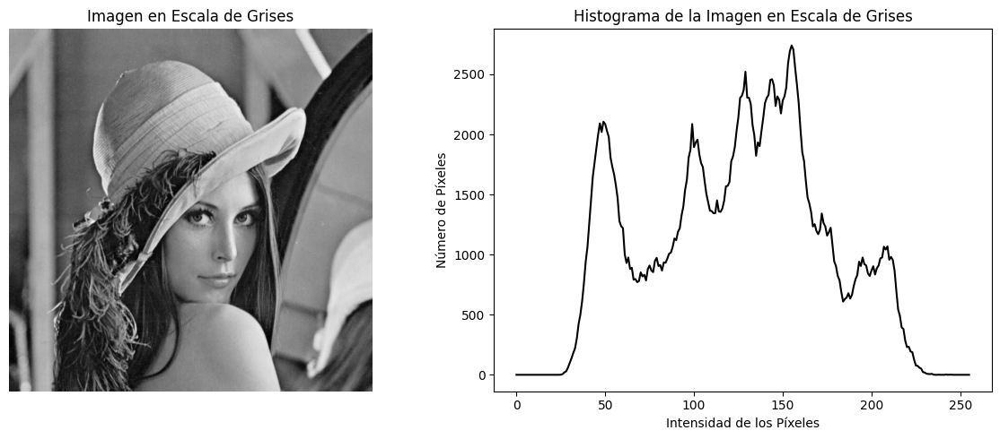

In [ ]:
# Convertir la imagen a escala de grises
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Calcular el histograma para la imagen en escala de grises
hist_gray = cv2.calcHist([gray], [0], None, [256], [0, 256])

# Visualizar la imagen en escala de grises y su histograma
plt.figure(figsize=(12, 5))

plt.subplot(121)
plt.imshow(gray, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')

plt.subplot(122)
plt.plot(hist_gray, color='black')
plt.title('Histograma de la Imagen en Escala de Grises')
plt.xlabel('Intensidad de los Píxeles')
plt.ylabel('Número de Píxeles')

plt.tight_layout()
plt.show()

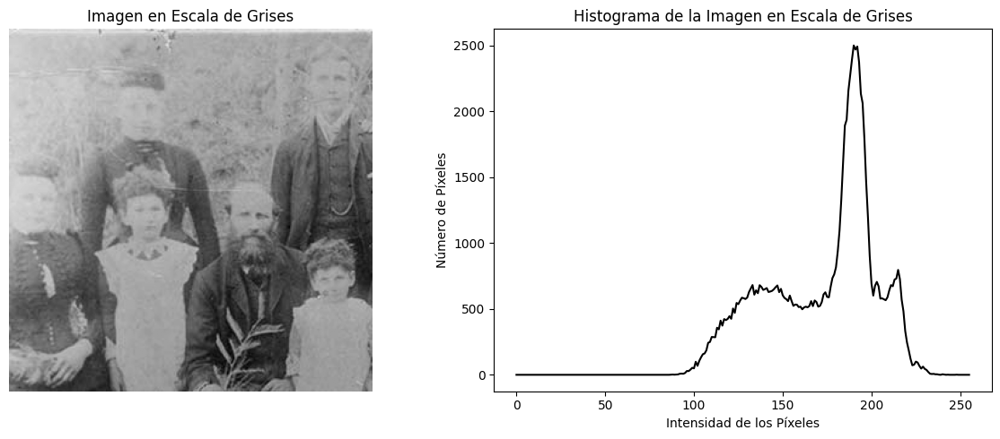

In [ ]:
faded = cv2.imread('/content/faded-photo.jpg', cv2.IMREAD_GRAYSCALE)

hist_faded = cv2.calcHist([faded], [0], None, [256], [0, 256])

# Visualizar la imagen en escala de grises y su histograma
plt.figure(figsize=(12, 5))

plt.subplot(121)
plt.imshow(faded, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')

plt.subplot(122)
plt.plot(hist_faded, color='black')
plt.title('Histograma de la Imagen en Escala de Grises')
plt.xlabel('Intensidad de los Píxeles')
plt.ylabel('Número de Píxeles')

plt.tight_layout()
plt.show()

## Binarización

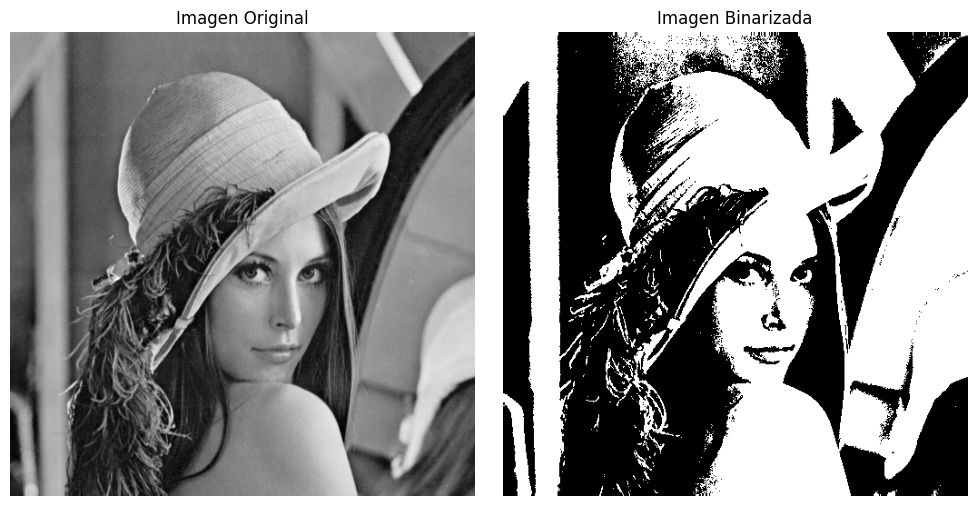

In [ ]:
# Aplicar la binarización con un umbral específico
_, binary_img = cv2.threshold(
    gray,
    127,
    255,
    cv2.THRESH_BINARY # cv2.THRESH_BINARY_INV, cv2.THRESH_TRUNC,cv2.THRESH_TOZERO, cv2.THRESH_TOZERO_INV
)

# Mostrar la imagen original y la imagen binarizada
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(gray, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(122)
plt.imshow(binary_img, cmap='gray')
plt.title('Imagen Binarizada')
plt.axis('off')

plt.tight_layout()
plt.show()

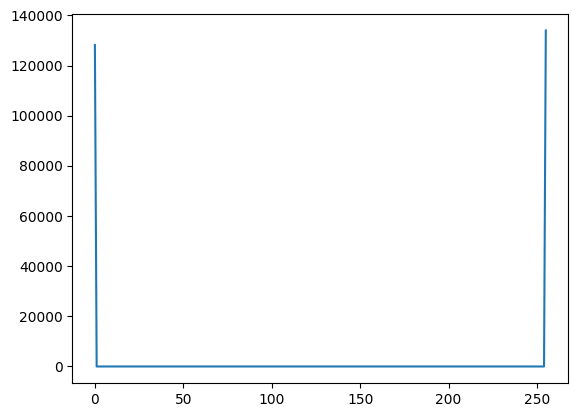

In [ ]:
hist_binary = cv2.calcHist([binary_img], [0], None, [256], [0, 256])
plt.plot(hist_binary)

## Transformaciones

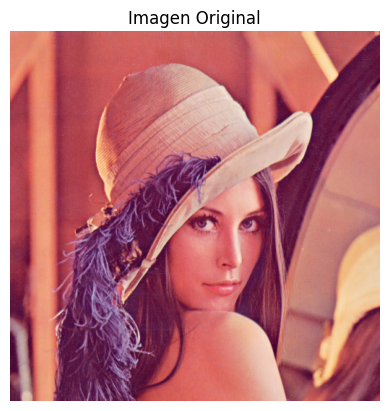

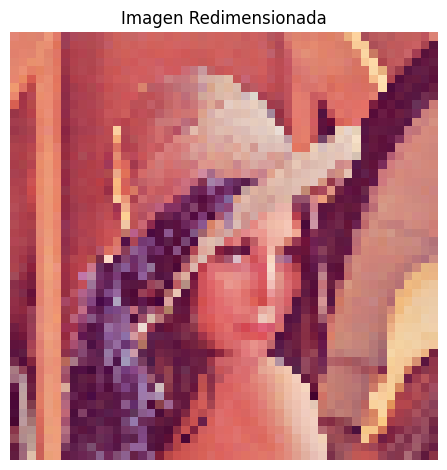

In [ ]:
# Redimensionar la imagen
resized_img = cv2.resize(img, (50, 50))

# Mostrar la imagen original y la redimensionada
plt.figure()
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Imagen Original')
plt.axis('off')
plt.show()

plt.figure()
plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.title('Imagen Redimensionada')
plt.axis('off')

plt.tight_layout()
plt.show()

### Rotación

In [ ]:
img.shape

(512, 512, 3)

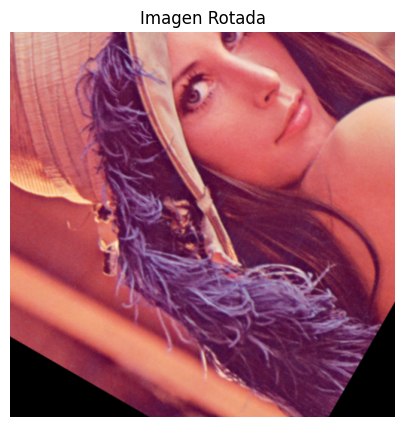

In [ ]:
(h, w) = img.shape[:2]
center = (w // 4, h // 2)
angle = 60
scale = 1.5

M = cv2.getRotationMatrix2D(center, angle, scale)
rotated_img = cv2.warpAffine(img, M, (w, h))

# Mostrar la imagen rotada
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB))
plt.title('Imagen Rotada')
plt.axis('off')
plt.show()

### Inclinación

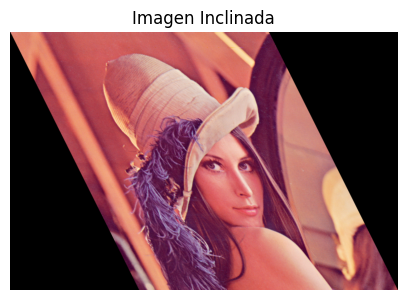

In [ ]:
# Transformación de inclinación
shear_factor = 0.5
M = np.float32([
    [1, shear_factor, 0], # = x
    [0, 1, 0] # = y
])

# Aplicación de la transformación
sheared_img = cv2.warpAffine(img, M, (w + int(h * shear_factor), h))

# Mostrar la imagen inclinada
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(sheared_img, cv2.COLOR_BGR2RGB))
plt.title('Imagen Inclinada')
plt.axis('off')
plt.show()

### Espejo

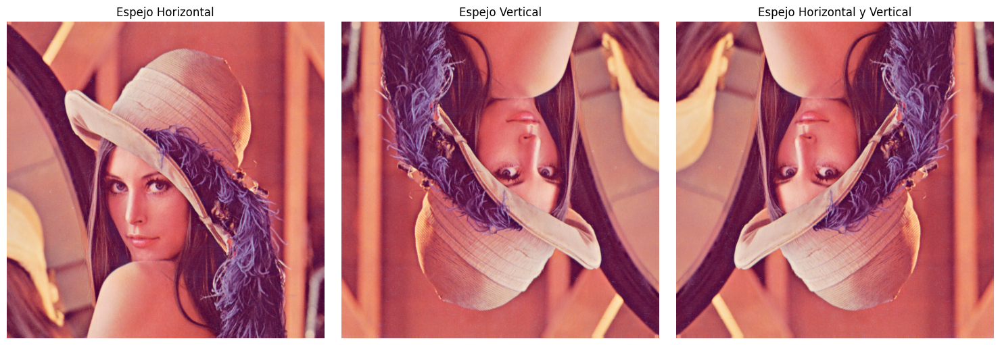

In [ ]:
# Espejo horizontal
flipped_horizontally = cv2.flip(img, 1)

# Espejo vertical
flipped_vertically = cv2.flip(img, 0)

# Espejo horizontal y vertical
flipped_both = cv2.flip(img, -1)

# Mostrar las imágenes espejadas
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv2.cvtColor(flipped_horizontally, cv2.COLOR_BGR2RGB))
plt.title('Espejo Horizontal')
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(flipped_vertically, cv2.COLOR_BGR2RGB))
plt.title('Espejo Vertical')
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(flipped_both, cv2.COLOR_BGR2RGB))
plt.title('Espejo Horizontal y Vertical')
plt.axis('off')

plt.tight_layout()
plt.show()

## Ruido

In [ ]:
# Gaussiano
h, w, ch= img.shape
mean = 127
var = 8
sigma = var ** 0.5
gauss = np.random.normal(mean, sigma, (h, w, ch))
gauss = gauss.reshape(h,w,ch)
print(gauss)

gaussian = img + gauss
gaussian = np.round(gaussian)

# Guardar imagen
cv2.imwrite('/content/gaussian.jpg', gaussian, [int(cv2.IMWRITE_JPEG_QUALITY), 100])

[[[130.49729882 122.32253548 126.34936011]
  [128.65709496 129.20310325 123.70056245]
  [127.14888845 126.11424865 124.80670708]
  ...
  [129.30878633 126.7525424  122.71376789]
  [130.88160025 132.98844383 124.32091557]
  [130.08265701 128.65569239 125.45299086]]

 [[132.09891351 127.18715922 123.73899944]
  [121.27459868 129.35526523 130.4740365 ]
  [128.09848388 130.6774767  122.18082102]
  ...
  [130.38777604 129.67431622 128.94233967]
  [124.46744482 128.47269293 125.89534468]
  [129.30266746 130.74610314 124.46195638]]

 [[125.89302529 127.87428299 127.70148842]
  [125.54539072 127.67950184 129.14743616]
  [128.28485414 123.35401529 123.03064689]
  ...
  [125.92631949 128.55359104 128.44248308]
  [124.36674358 125.30406017 132.38922331]
  [125.96130701 125.30259811 120.54969196]]

 ...

 [[130.48118801 128.03845101 128.55981074]
  [132.14080255 124.26669055 126.80746027]
  [128.84799676 131.48302674 124.70025884]
  ...
  [129.79962655 124.76703292 130.17285842]
  [126.85110491 12

True

### Sal y pimienta

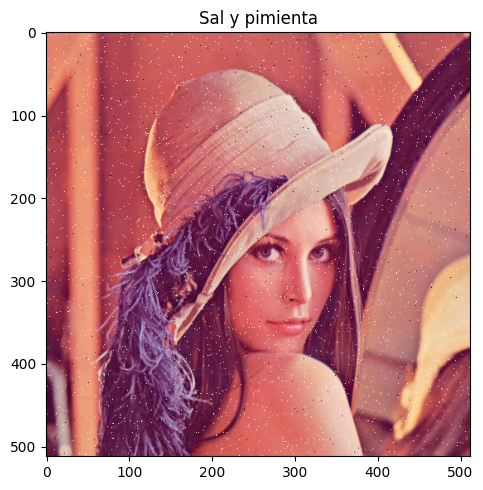

In [ ]:
row,col,ch = img.shape
s_vs_p = 0.9
amount = 0.01
out = np.copy(img)

num_salt = np.ceil(amount * img.shape[0] * img.shape[1] * s_vs_p).astype(int)
coords = (
    np.random.randint(0, img.shape[0], num_salt),
    np.random.randint(0, img.shape[1], num_salt)
)
out[coords] = 255

num_pepper = np.ceil(amount * img.shape[0] * img.shape[1] * (1 - s_vs_p)).astype(int)
coords = (
    np.random.randint(0, img.shape[0], num_pepper),
    np.random.randint(0, img.shape[1], num_pepper)
)
out[coords] = 0

plt.figure(figsize=(15, 5))

plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
plt.title('Sal y pimienta')

plt.tight_layout()
plt.show()

## Detección de esquinas

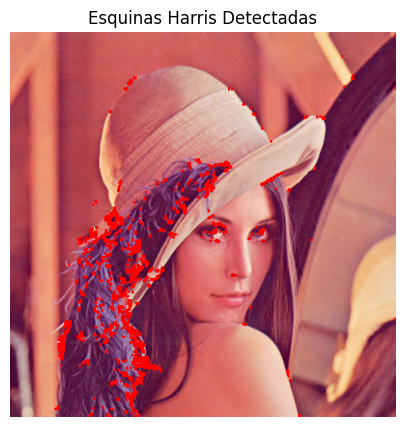

In [ ]:
img_border = img.copy()

# Aplicar la detección de esquinas Harris
dst = cv2.cornerHarris(
    gray, # imagen
    2, # tamaño vecindario
    3, # tamaño kernel de Sobel: Para detectar cambios (valor pequeño: cambios cercanos; valor grande: cambios a gran escala, menos sensible a ruido)
    0.01 # parámetro libre de Harris: Sensibilidad de detección (valor pequeño: muy sensible, falsos positivos; grande [0.06]: menos selectivo, menos)
    )

# Dilatar el resultado para marcar mejor las esquinas
dst = cv2.dilate(dst, None)

# Umbral para marcar las esquinas en la imagen original
img_border[dst > 0.01 * dst.max()] = [0, 0, 255]

# Mostrar la imagen con las esquinas detectadas
plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(img_border, cv2.COLOR_BGR2RGB))
plt.title('Esquinas Harris Detectadas')
plt.axis('off')
plt.show()

## Puntos clave

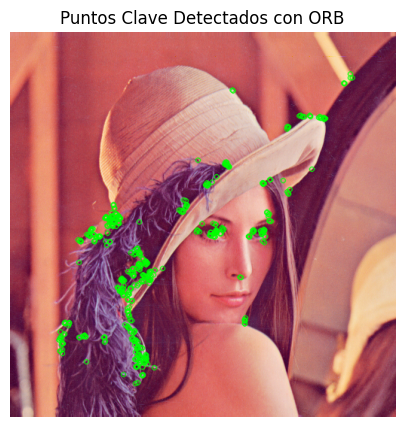

In [ ]:
# Detecta cambios entre vecinos (no sólo bordes; principalmente contrastes)
# Crear un detector ORB
orb = cv2.ORB_create()

# Detectar puntos clave y computar descriptores
keypoints, descriptors = orb.detectAndCompute(gray, None)

# Dibujar los puntos clave detectados
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, color=(0, 255, 0), flags=0)

# Mostrar la imagen con los puntos clave detectados
plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Puntos Clave Detectados con ORB')
plt.axis('off')
plt.show()

## Compresión

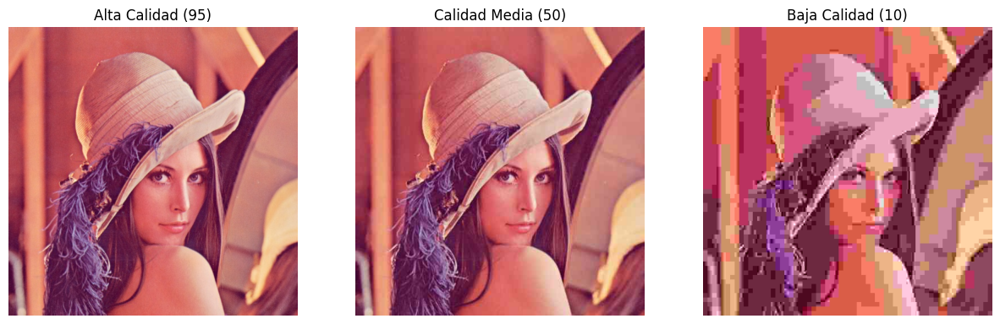

In [ ]:
# Cargar la imagen
img = cv2.imread('/content/Lenna_(test_image).png')

# Guardar la imagen con diferentes niveles de calidad
cv2.imwrite('/content/lenna_compressed_high_quality.jpg', img, [int(cv2.IMWRITE_JPEG_QUALITY), 95])
cv2.imwrite('/content/lenna_compressed_medium_quality.jpg', img, [int(cv2.IMWRITE_JPEG_QUALITY), 30])
cv2.imwrite('/content/lenna_compressed_low_quality.jpg', img, [int(cv2.IMWRITE_JPEG_QUALITY), 1])

# Cargar las imágenes comprimidas
img_high = cv2.imread('lenna_compressed_high_quality.jpg')
img_medium = cv2.imread('lenna_compressed_medium_quality.jpg')
img_low = cv2.imread('lenna_compressed_low_quality.jpg')

# Convertir BGR a RGB para matplotlib
img_high = cv2.cvtColor(img_high, cv2.COLOR_BGR2RGB)
img_medium = cv2.cvtColor(img_medium, cv2.COLOR_BGR2RGB)
img_low = cv2.cvtColor(img_low, cv2.COLOR_BGR2RGB)

# Mostrar las imágenes comprimidas
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img_high)
axes[0].set_title('Alta Calidad (95)')
axes[0].axis('off')

axes[1].imshow(img_medium)
axes[1].set_title('Calidad Media (50)')
axes[1].axis('off')

axes[2].imshow(img_low)
axes[2].set_title('Baja Calidad (10)')
axes[2].axis('off')

plt.show()

## Detección de bordes

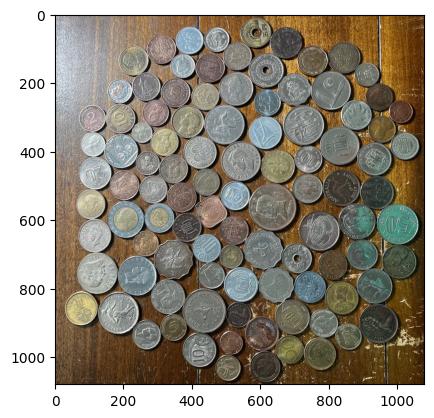

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar la imagen
img = cv2.imread('/content/coins.avif') #('/content/coins-orig.jpg')
# Convertir BGR a RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mostrar la imagen usando matplotlib
plt.imshow(img_rgb)
plt.show()

(array([36., 27., 37., 19., 17., 16., 21., 49., 14., 20.]),
 array([ 149.        , 1095.80004883, 2042.59997559, 2989.39990234,
        3936.19995117, 4883.        , 5829.79980469, 6776.60009766,
        7723.39990234, 8670.20019531, 9617.        ]),
 <BarContainer object of 10 artists>)

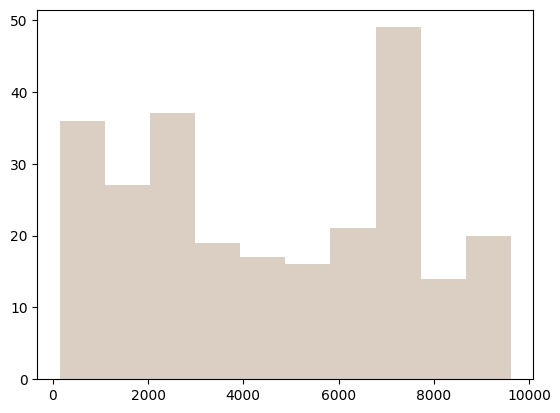

In [ ]:
# Convertir a escala de grises
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
hist_gray = cv2.calcHist([gray], [0], None, [256], [0, 256])

# Aplicar desenfoque Gaussiano
blurred = cv2.GaussianBlur(gray, (11, 11), 0)
hist_blurred = cv2.calcHist([gray], [0], None, [256], [0, 256])

plt.show()
plt.hist(hist_gray, alpha = 0.2)
plt.hist(hist_blurred, alpha = 0.2)

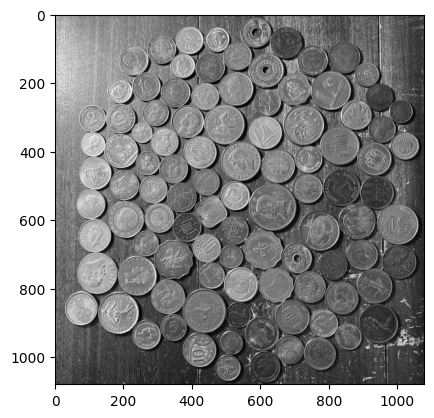

In [ ]:
# Mostrar la imagen usando matplotlib
plt.imshow(gray, cmap='gray')
plt.show()

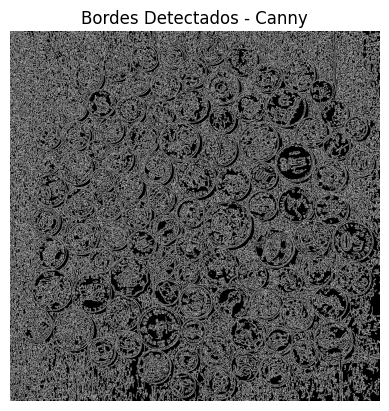

In [ ]:
# Detectar bordes usando el detector de Canny
edges = cv2.Canny(gray, 30, 150)

plt.imshow(edges, cmap='gray')
plt.title('Bordes Detectados - Canny')
plt.axis('off')
plt.show()

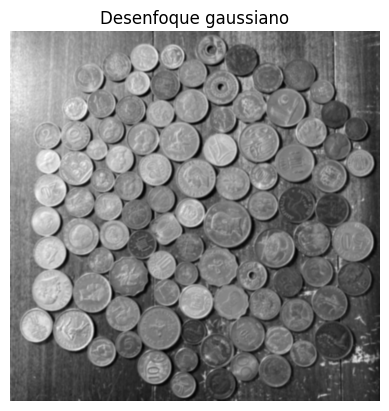

In [ ]:
plt.imshow(blurred, cmap='gray')
plt.title('Desenfoque gaussiano')
plt.axis('off')
plt.show()

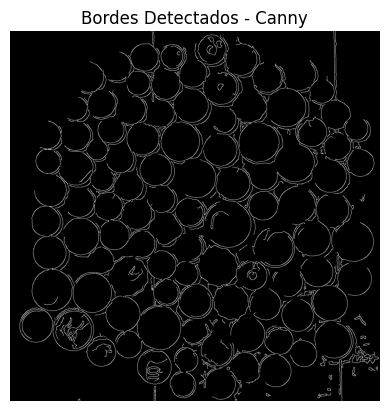

In [ ]:
# Detectar bordes usando el detector de Canny
edges = cv2.Canny(blurred, 30, 150)

plt.imshow(edges, cmap='gray')
plt.title('Bordes Detectados - Canny')
plt.axis('off')
plt.show()

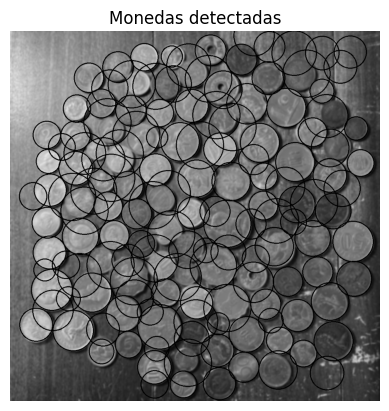

In [ ]:
img_circles = blurred.copy()
circles = cv2.HoughCircles(
    blurred,
    cv2.HOUGH_GRADIENT,
    dp=1.2, # Relación entre modelo de detección y resolución de la imagen; 2: Más rápido, menos preciso
    minDist=50, # Distancia mínima entre centros
    param1=50, # Detección de bordes (50, 100, 150)
    param2=30, # Detección de círculos (20, 30, 40)
    minRadius=30, # Radio mínimo
    maxRadius=70) # Radio máximo
circles = np.uint16(np.around(circles))
for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(img_circles,(i[0],i[1]),i[2],(0,255,0),2)

# Mostrar la imagen original con los círculos detectados
plt.imshow(cv2.cvtColor(img_circles, cv2.COLOR_BGR2RGB))
plt.title('Monedas detectadas')
plt.axis('off')
plt.show()

## Ejemplo coloreo por rangos de color

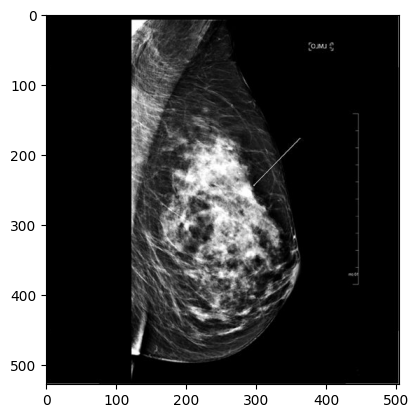

In [ ]:
img_bc = cv2.imread('/content/breast_cancer_example.jpg')

plt.figure()
plt.imshow(img_bc)
plt.show()

In [ ]:
img_bc.shape

(528, 504, 3)

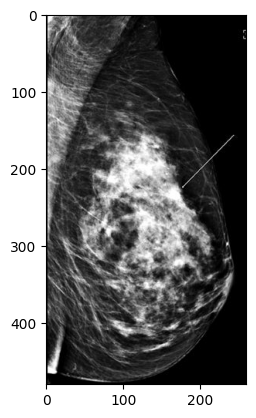

In [ ]:
img_bc_gray = cv2.cvtColor(img_bc, cv2.COLOR_BGR2GRAY)
img_bc_cropped = img_bc_gray[
    20:500, # alto
    120:380 # ancho
    ]
plt.imshow(img_bc_cropped, cmap='gray')

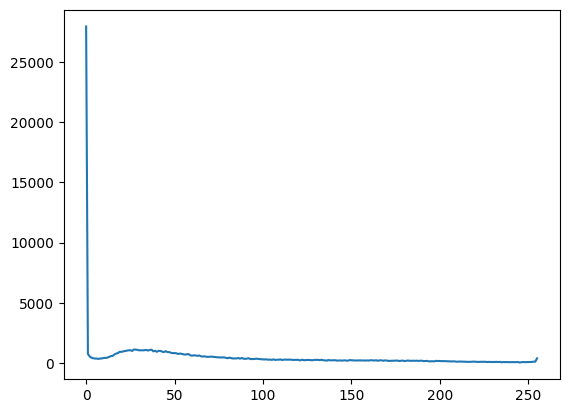

In [ ]:
import os

# Calculamos el histograma de la imagen
hist_binary = cv2.calcHist([img_bc_cropped], [0], None, [256], [0, 256])
plt.plot(hist_binary)

array([[  0,  16, 223, ...,   0,   0,   0],
       [  0,  16, 223, ...,   0,   0,   0],
       [  0,  16, 223, ...,   0,   0,   0],
       ...,
       [  0,   6,  42, ...,   0,   0,   0],
       [  0,   3,  31, ...,   0,   0,   0],
       [  2,   2,  40, ...,   0,   0,   0]], dtype=uint8)
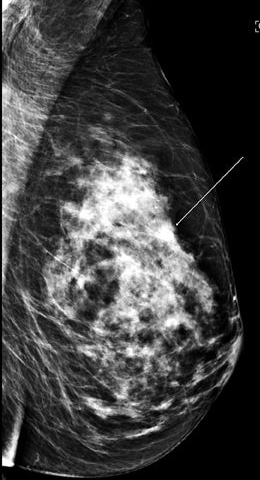

In [ ]:
img_bc_cropped

In [ ]:
img_bc_cropped[(img_bc_cropped > 50) & (img_bc_cropped < 150)]

array([128, 115, 126, ...,  51,  54,  51], dtype=uint8)

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)
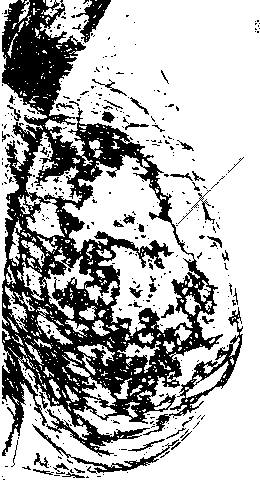

In [ ]:
# Pixeles entre 50 y 150
bc_range = (img_bc_cropped > 50) & (img_bc_cropped < 150)
negros = img_bc_cropped < 20
bc_range
# Convertir booleanos a enteros
bc_range = 1 * bc_range

bc_range = np.where((bc_range==0)|(bc_range==1), bc_range ^ 1, bc_range)
bc_range = 255 * bc_range
# Es importante convertir los valores a uint8 (que es el formato usado para las imágenes
# por OpenCV)
# https://stackoverflow.com/a/46689933/25293154
bc_range = bc_range.astype(np.uint8)
bc_range

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
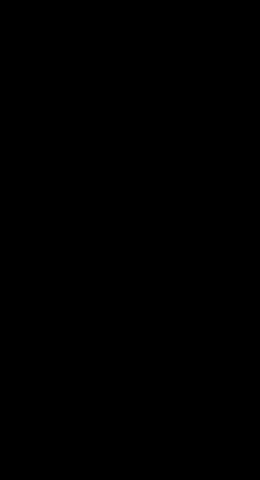

In [ ]:
# Crear una imagen en negro con el mismo tamaño
zeros = np.zeros(bc_range.shape, dtype="uint8")
zeros

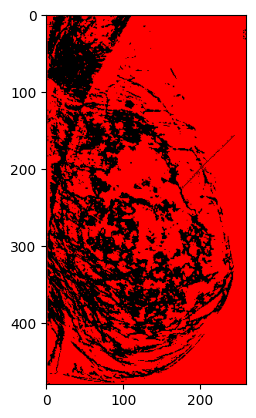

In [ ]:
# Crear imágenes para cada canal de color
img_red = cv2.merge([bc_range, zeros, zeros])
plt.imshow(img_red, cmap='gray')

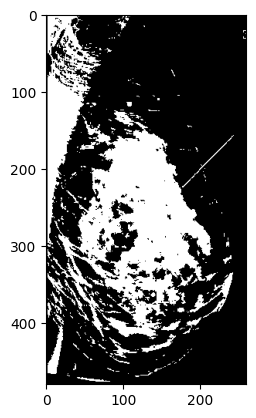

In [ ]:
ret,thresh3 = cv2.threshold(img_bc_cropped,80,81,cv2.THRESH_BINARY)
plt.imshow(thresh3, cmap='gray')

# Tarea
- Hacer algo análogo a: Encontrar centros de objetos circulares de imágenes de Internet o tomadas por el alumno.
- Compartir hallazgos con el grupo a través de un reporte en Markdown o un PDF en latex.